In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv')

# Display shape and first few rows
print("Shape:", df.shape)
display(df.head())

# Show column names
print("\nColumns:", df.columns.tolist())

# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())

# Ensure correct datatypes
df['PatientAge'] = pd.to_numeric(df['PatientAge'], errors='coerce')


Shape: (4405, 18)


,SeriesInstanceUID,PatientAge,PatientSex,Modality,Left Infraclinoid Internal Carotid Artery,Right Infraclinoid Internal Carotid Artery,Left Supraclinoid Internal Carotid Artery,Right Supraclinoid Internal Carotid Artery,Left Middle Cerebral Artery,Right Middle Cerebral Artery,Anterior Communicating Artery,Left Anterior Cerebral Artery,Right Anterior Cerebral Artery,Left Posterior Communicating Artery,Right Posterior Communicating Artery,Basilar Tip,Other Posterior Circulation,Aneurysm Present
0,1.2.826.0.1.3680043.8.498.10004044428023505108...,64,Female,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.2.826.0.1.3680043.8.498.10004684224894397679...,76,Female,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.2.826.0.1.3680043.8.498.10005158603912009425...,58,Male,CTA,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,1.2.826.0.1.3680043.8.498.10009383108068795488...,71,Male,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.8.498.10012790035410518400...,48,Female,MRA,0,0,0,0,0,0,0,0,0,0,0,0,0,0



Columns: ['SeriesInstanceUID', 'PatientAge', 'PatientSex', 'Modality', 'Left Infraclinoid Internal Carotid Artery', 'Right Infraclinoid Internal Carotid Artery', 'Left Supraclinoid Internal Carotid Artery', 'Right Supraclinoid Internal Carotid Artery', 'Left Middle Cerebral Artery', 'Right Middle Cerebral Artery', 'Anterior Communicating Artery', 'Left Anterior Cerebral Artery', 'Right Anterior Cerebral Artery', 'Left Posterior Communicating Artery', 'Right Posterior Communicating Artery', 'Basilar Tip', 'Other Posterior Circulation', 'Aneurysm Present']

Missing values:
SeriesInstanceUID                             0
PatientAge                                    0
PatientSex                                    0
Modality                                      0
Left Infraclinoid Internal Carotid Artery     0
Right Infraclinoid Internal Carotid Artery    0
Left Supraclinoid Internal Carotid Artery     0
Right Supraclinoid Internal Carotid Artery    0
Left Middle Cerebral Artery          

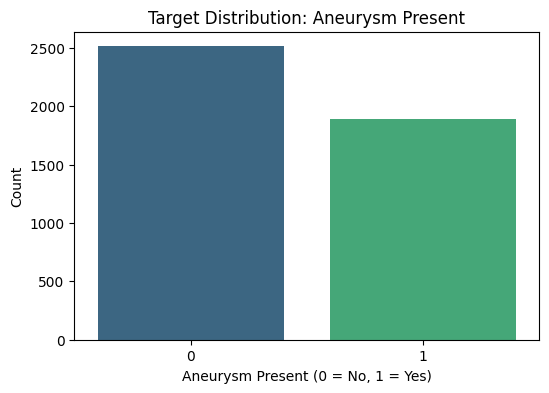

Aneurysm Present
0    57.026107
1    42.973893
Name: proportion, dtype: float64


In [27]:
plt.figure(figsize=(6, 4))
sns.countplot(x='Aneurysm Present', data=df, palette='viridis')
plt.title('Target Distribution: Aneurysm Present')
plt.xlabel('Aneurysm Present (0 = No, 1 = Yes)')
plt.ylabel('Count')
plt.show()

print(df['Aneurysm Present'].value_counts(normalize=True) * 100)


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


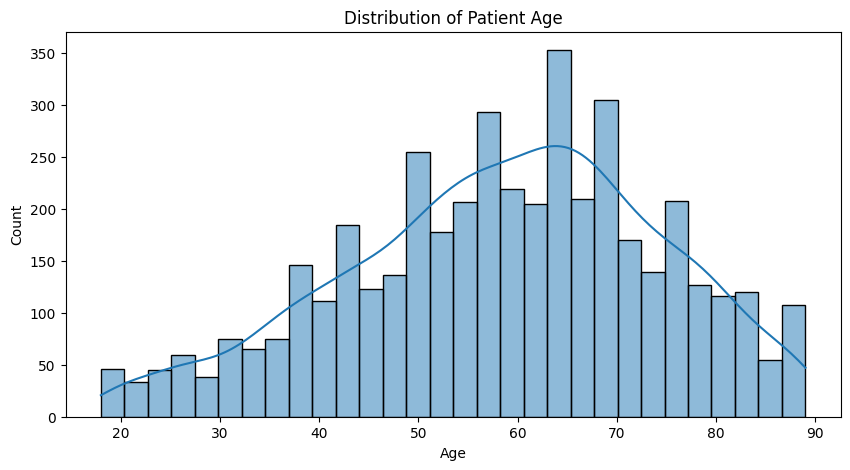

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

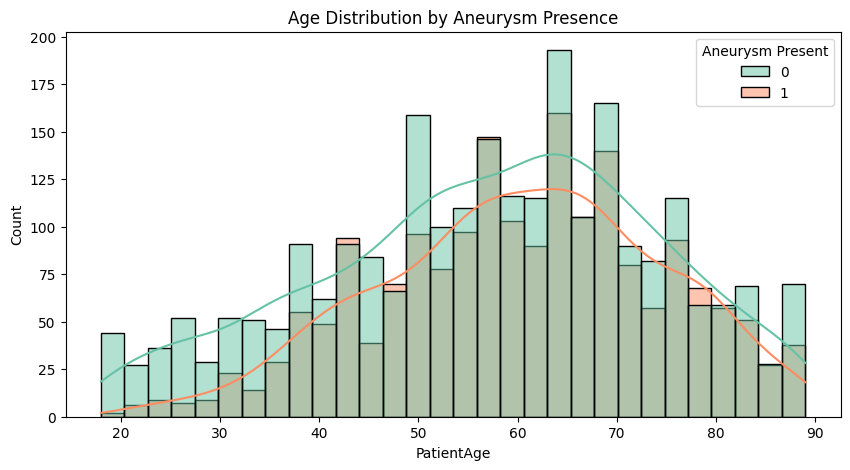

In [28]:
plt.figure(figsize=(10, 5))
sns.histplot(df['PatientAge'], bins=30, kde=True)
plt.title('Distribution of Patient Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

# By Aneurysm class
plt.figure(figsize=(10, 5))
sns.histplot(data=df, x='PatientAge', hue='Aneurysm Present', bins=30, kde=True, palette='Set2')
plt.title('Age Distribution by Aneurysm Presence')
plt.show()


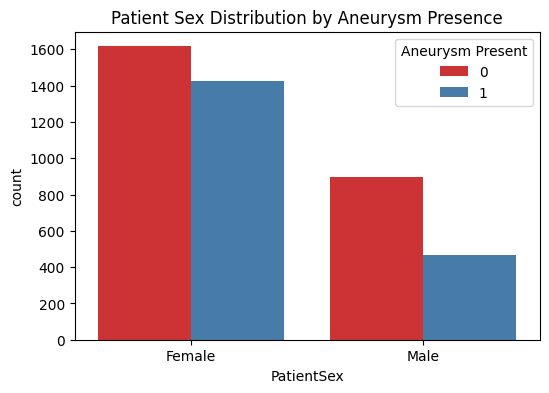

In [29]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='PatientSex', hue='Aneurysm Present', palette='Set1')
plt.title('Patient Sex Distribution by Aneurysm Presence')
plt.show()


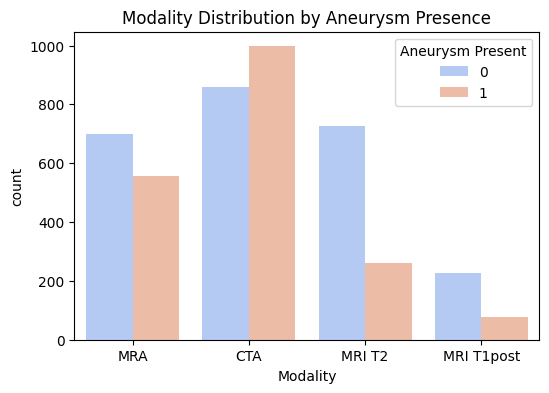

In [30]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='Modality', hue='Aneurysm Present', palette='coolwarm')
plt.title('Modality Distribution by Aneurysm Presence')
plt.show()


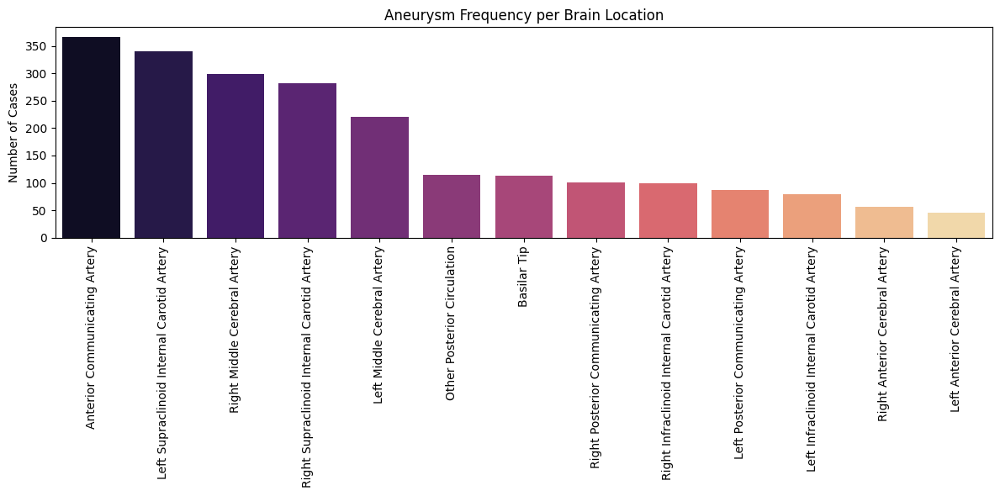

In [31]:
# Extract columns for anatomical locations
location_cols = df.columns[4:-1]  # From "Left Infraclinoid..." to "Other Posterior Circulation"

# Total count of positive aneurysms at each location
location_counts = df[location_cols].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=location_counts.index, y=location_counts.values, palette='magma')
plt.xticks(rotation=90)
plt.title('Aneurysm Frequency per Brain Location')
plt.ylabel('Number of Cases')
plt.tight_layout()
plt.show()


In [32]:
import os

# List the dataset root
print("Top-level input folders:")
print(os.listdir("/kaggle/input"))

# List the contents of the dataset folder
print("\nContents of rsna-intracranial-aneurysm-detection:")
print(os.listdir("/kaggle/input/rsna-intracranial-aneurysm-detection"))


Top-level input folders:
['rsna-intracranial-aneurysm-detection']

Contents of rsna-intracranial-aneurysm-detection:
['train_localizers.csv', 'segmentations', 'series', 'train.csv', 'kaggle_evaluation']


Loaded labels: (4405, 18)
Index(['SeriesInstanceUID', 'PatientAge', 'PatientSex', 'Modality',
       'Left Infraclinoid Internal Carotid Artery',
       'Right Infraclinoid Internal Carotid Artery',
       'Left Supraclinoid Internal Carotid Artery',
       'Right Supraclinoid Internal Carotid Artery',
       'Left Middle Cerebral Artery', 'Right Middle Cerebral Artery',
       'Anterior Communicating Artery', 'Left Anterior Cerebral Artery',
       'Right Anterior Cerebral Artery', 'Left Posterior Communicating Artery',
       'Right Posterior Communicating Artery', 'Basilar Tip',
       'Other Posterior Circulation', 'Aneurysm Present'],
      dtype='object')
Checking for DICOM presence in each series... this can take a while.
Total series: 4405
Series with DICOM images (decom): 4405
Series without DICOM images (nil): 0


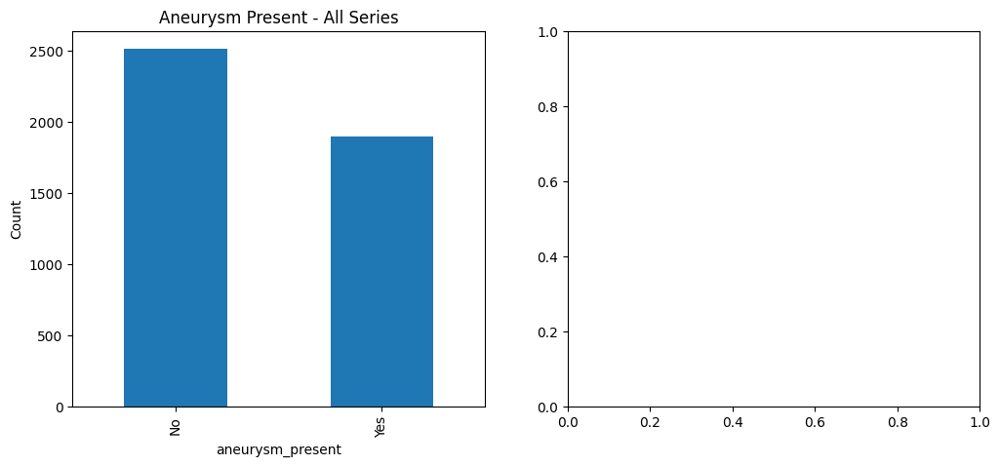

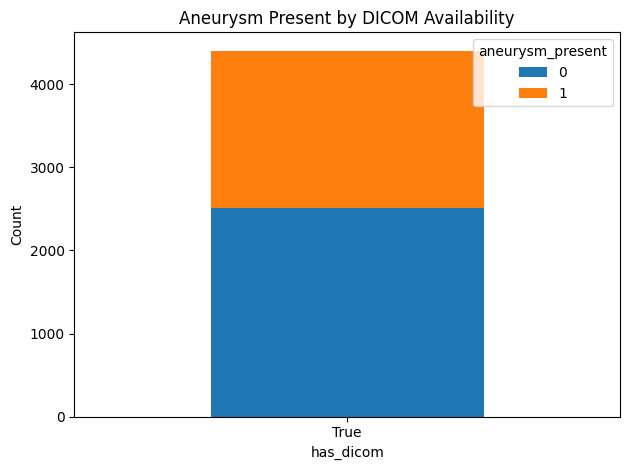

Visualizing some random DICOM series slices:


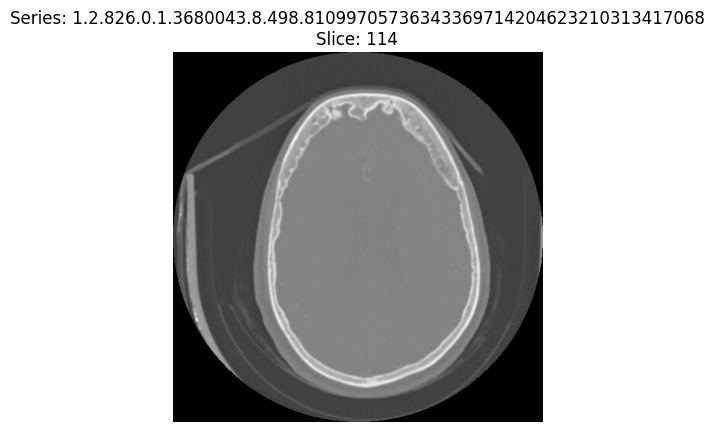

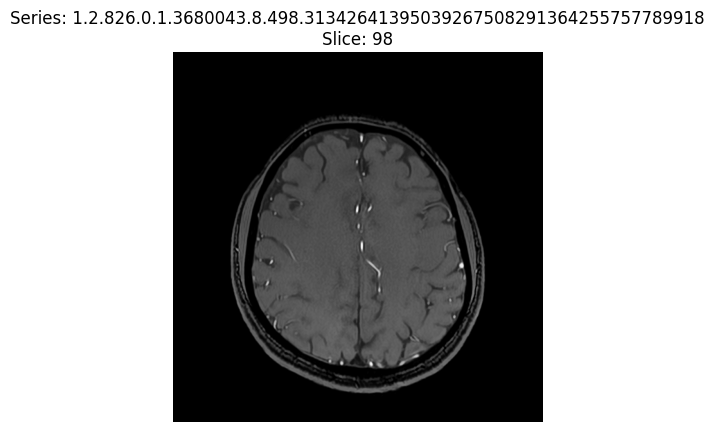

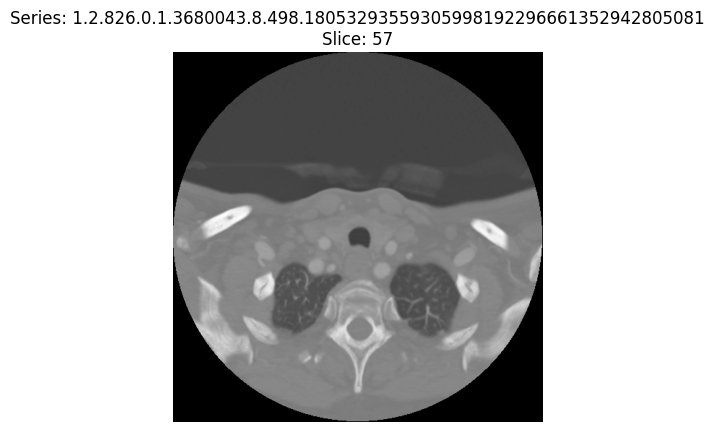

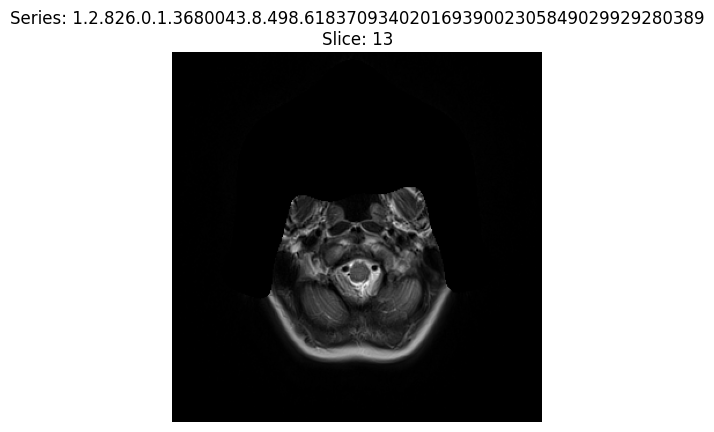

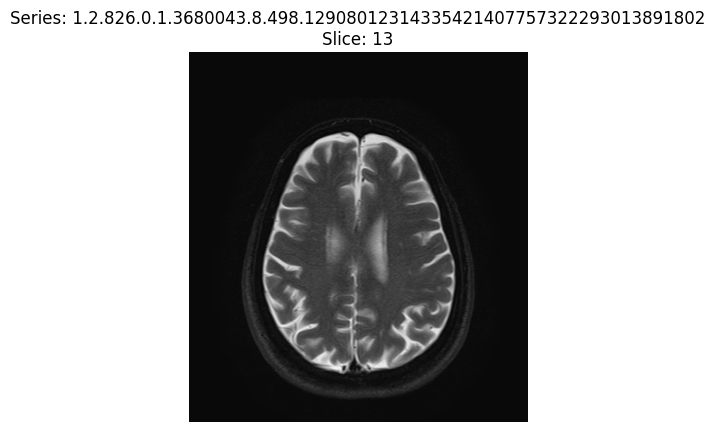

In [33]:
import os
import glob
import pandas as pd
import pydicom
import matplotlib.pyplot as plt
import random

# Paths
BASE_PATH = "/kaggle/input/rsna-intracranial-aneurysm-detection"
SERIES_PATH = os.path.join(BASE_PATH, "series")
LABELS_CSV = os.path.join(BASE_PATH, "train.csv")

# Load labels
df = pd.read_csv(LABELS_CSV)
print(f"Loaded labels: {df.shape}")
print(df.columns)

# Rename for convenience
df = df.rename(columns={'SeriesInstanceUID': 'series_id', 'Aneurysm Present': 'aneurysm_present'})

# Check which series have DICOM files
def check_series_dicom(series_id):
    folder = os.path.join(SERIES_PATH, series_id)
    if not os.path.exists(folder):
        return False
    files = glob.glob(os.path.join(folder, "*.dcm"))
    return len(files) > 0

# Create a new column 'has_dicom'
print("Checking for DICOM presence in each series... this can take a while.")
df['has_dicom'] = df['series_id'].apply(check_series_dicom)

# Summary stats
total_series = len(df)
series_with_dicom = df['has_dicom'].sum()
series_without_dicom = total_series - series_with_dicom

print(f"Total series: {total_series}")
print(f"Series with DICOM images (decom): {series_with_dicom}")
print(f"Series without DICOM images (nil): {series_without_dicom}")

# Label distribution (aneurysm present) overall and by decom/nil groups
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
df['aneurysm_present'].value_counts().plot(kind='bar')
plt.title("Aneurysm Present - All Series")
plt.xticks(ticks=[0,1], labels=['No', 'Yes'])
plt.ylabel("Count")

plt.subplot(1,2,2)
df.groupby('has_dicom')['aneurysm_present'].value_counts().unstack().plot(kind='bar', stacked=True)
plt.title("Aneurysm Present by DICOM Availability")
plt.xticks(rotation=0)
plt.ylabel("Count")

plt.tight_layout()
plt.show()

# Function to load and show a middle DICOM slice from a series
def visualize_middle_slice(series_id):
    folder = os.path.join(SERIES_PATH, series_id)
    dicom_files = sorted(glob.glob(os.path.join(folder, "*.dcm")))
    if len(dicom_files) == 0:
        print(f"No DICOM files found in series {series_id}")
        return
    try:
        slices = [pydicom.dcmread(f).pixel_array for f in dicom_files]
        volume = np.stack(slices, axis=0)
        mid_idx = volume.shape[0] // 2
        plt.imshow(volume[mid_idx], cmap='gray')
        plt.title(f"Series: {series_id}\nSlice: {mid_idx}")
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error loading series {series_id}: {e}")

# Visualize some random samples with DICOMs
print("Visualizing some random DICOM series slices:")
sample_series = df[df['has_dicom']].sample(min(5, series_with_dicom))
for sid in sample_series['series_id']:
    visualize_middle_slice(sid)


In [34]:
import pandas as pd
from scipy.stats import ttest_ind

# Load the CSV file
df = pd.read_csv('/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv')

# Clean up
df = df[['PatientSex', 'Aneurysm Present']].dropna()

# Group by sex
male = df[df['PatientSex'] == 'Male']['Aneurysm Present']
female = df[df['PatientSex'] == 'Female']['Aneurysm Present']

# Perform independent t-test
t_stat, p_val = ttest_ind(male, female, equal_var=False)  # Welch's t-test (does not assume equal variance)

# Print results
print(f"T-statistic: {t_stat:.4f}")
print(f"P-value: {p_val:.4f}")

if p_val < 0.05:
    print("❗There is a statistically significant difference in aneurysm presence between males and females.")
else:
    print("✅ No statistically significant difference in aneurysm presence between males and females.")


T-statistic: -8.0642
P-value: 0.0000
❗There is a statistically significant difference in aneurysm presence between males and females.


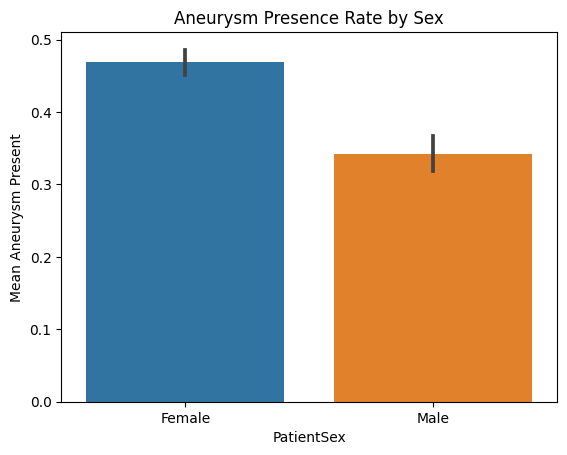

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(data=df, x='PatientSex', y='Aneurysm Present')
plt.title("Aneurysm Presence Rate by Sex")
plt.ylabel("Mean Aneurysm Present")
plt.show()


Classification Report:
              precision    recall  f1-score   support

           0     0.6441    0.5299    0.5814       502
           1     0.4957    0.6121    0.5478       379

    accuracy                         0.5653       881
   macro avg     0.5699    0.5710    0.5646       881
weighted avg     0.5803    0.5653    0.5670       881

Confusion Matrix:


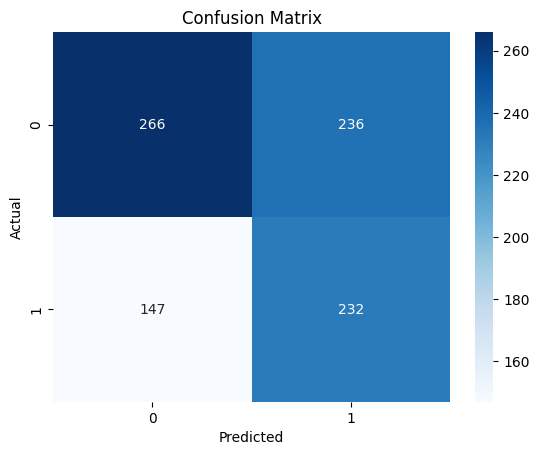

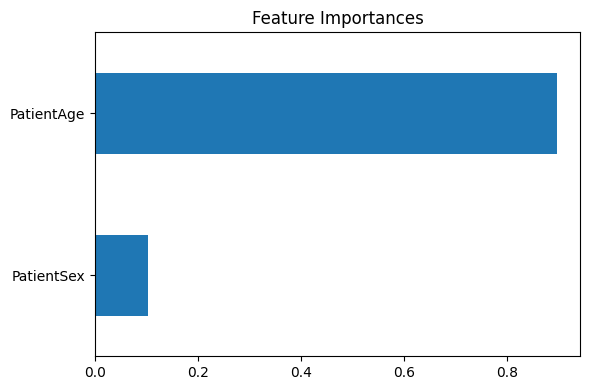

In [38]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load CSV
df = pd.read_csv('/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv')

# Drop rows with missing target
df = df.dropna(subset=["Aneurysm Present"])

# Encode PatientSex (Female=0, Male=1), fill unknowns with -1
df['PatientSex'] = df['PatientSex'].map({'Female': 0, 'Male': 1}).fillna(-1)

# Fill missing ages with median
df['PatientAge'] = df['PatientAge'].fillna(df['PatientAge'].median())

# Define features without location columns to avoid leakage
features = ['PatientAge', 'PatientSex']

X = df[features]
y = df['Aneurysm Present']

# Train-test split with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Initialize Random Forest with balanced class weights
rf = RandomForestClassifier(
    n_estimators=100,
    class_weight='balanced',
    random_state=42
)

# Train model
rf.fit(X_train, y_train)

# Predict on test set
y_pred = rf.predict(X_test)

# Evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred, digits=4))

print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Feature importance plot
importances = pd.Series(rf.feature_importances_, index=features)
importances.sort_values(ascending=True).plot(kind='barh', figsize=(6, 4))
plt.title("Feature Importances")
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best hyperparameters: {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Classification Report for Best Model:
              precision    recall  f1-score   support

           0     0.6455    0.5478    0.5927       502
           1     0.5011    0.6016    0.5468       379

    accuracy                         0.5709       881
   macro avg     0.5733    0.5747    0.5697       881
weighted avg     0.5834    0.5709    0.5729       881



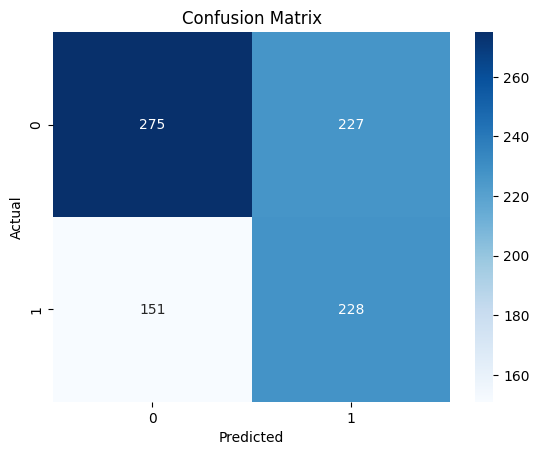

In [40]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load and preprocess data (same as before)
df = pd.read_csv('/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv')
df = df.dropna(subset=["Aneurysm Present"])
df['PatientSex'] = df['PatientSex'].map({'Female': 0, 'Male': 1}).fillna(-1)
df['PatientAge'] = df['PatientAge'].fillna(df['PatientAge'].median())

features = ['PatientAge', 'PatientSex']
X = df[features]
y = df['Aneurysm Present']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'class_weight': ['balanced']
}

# Initialize GridSearchCV with RandomForestClassifier
grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=2  # optional, for progress output
)

# Fit grid search on training data (no resampling)
grid_search.fit(X_train, y_train)

# Best estimator from grid search
best_model = grid_search.best_estimator_

print("Best hyperparameters:", grid_search.best_params_)

# Evaluate best model on test set
y_pred = best_model.predict(X_test)

print("Classification Report for Best Model:")
print(classification_report(y_test, y_pred, digits=4))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0,1], yticklabels=[0,1])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


Found 188 DICOM files.


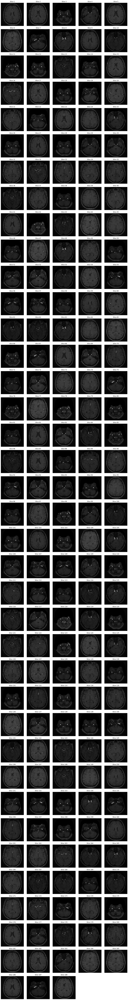

In [30]:
import os
import pydicom
import matplotlib.pyplot as plt
from glob import glob

dicom_folder = "/kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.10004044428023505108375152878107656647"  # replace with your folder

# Get sorted list of all dicom files in folder
dicom_files = sorted(glob(os.path.join(dicom_folder, "*.dcm")))

print(f"Found {len(dicom_files)} DICOM files.")

# Load all slices
slices = [pydicom.dcmread(f) for f in dicom_files]

# Extract pixel arrays
images = [s.pixel_array for s in slices]

# Plot all slices in a grid
cols = 5
rows = (len(images) + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
axes = axes.flatten()

for i, img in enumerate(images):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'Slice {i+1}')
    axes[i].axis('off')

# Hide any empty subplots
for i in range(len(images), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [58]:
import os
from pathlib import Path

dicom_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # your series folder

total_dicom_count = 0

for series_folder in dicom_root.iterdir():
    if series_folder.is_dir():
        dicom_files = list(series_folder.glob("*.dcm"))
        count = len(dicom_files)
        total_dicom_count += count

print(f"\nTotal DICOM images in all series folders: {total_dicom_count}")



Total DICOM images in all series folders: 1012263


In [59]:
from pathlib import Path

dicom_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # your series folder path

folder_count = sum(1 for p in dicom_root.iterdir() if p.is_dir())

print(f"Total folders in series folder: {folder_count}")


Total folders in series folder: 4405


In [60]:
from pathlib import Path

dicom_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # your series folder path

empty_folders = []

for series_folder in dicom_root.iterdir():
    if series_folder.is_dir():
        dicom_files = list(series_folder.glob("*.dcm"))
        if len(dicom_files) == 0:
            empty_folders.append(series_folder.name)

if empty_folders:
    print("Folders with zero DICOM files:")
    for folder in empty_folders:
        print(f" - {folder}")
else:
    print("No folders with zero DICOM files found.")


No folders with zero DICOM files found.


In [73]:
from pathlib import Path
from multiprocessing import Pool
import pydicom

series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # update path as needed

def get_dicom_shape(folder):
    for dcm_file in folder.glob("*.dcm"):
        if dcm_file.is_file():
            try:
                ds = pydicom.dcmread(str(dcm_file), stop_before_pixels=True)
                return (int(ds.Rows), int(ds.Columns))
            except Exception as e:
                print(f"Failed to read {dcm_file}: {e}")
    return None  # If no readable files found

if __name__ == "__main__":
    folders = [f for f in series_root.iterdir() if f.is_dir()]

    with Pool() as pool:
        shapes = pool.map(get_dicom_shape, folders)

    shapes = [s for s in shapes if s is not None]

    if not shapes:
        print("No DICOM files found.")
    else:
        unique_shapes = set(shapes)
        if len(unique_shapes) == 1:
            print(f"All DICOM series have the same image shape: {unique_shapes.pop()}")
        else:
            print(f"DICOM image shapes vary across series.")
            print(f"Unique shapes count: {len(unique_shapes)}")
            print(f"Sample shapes: {list(unique_shapes)[:5]}")


DICOM image shapes vary across series.
Unique shapes count: 192
Sample shapes: [(384, 306), (448, 406), (704, 640), (640, 512), (864, 812)]


In [75]:
from pathlib import Path
import pydicom

# Path to your dataset
series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")

# Choose a few sample folders to test (e.g., first 5)
sample_folders = [f for f in series_root.iterdir() if f.is_dir()][:5]

# Check dimensions within each folder
for folder in sample_folders:
    shapes = set()
    for dcm_file in folder.glob("*.dcm"):
        try:
            ds = pydicom.dcmread(dcm_file, stop_before_pixels=True)
            shape = (ds.Rows, ds.Columns)
            shapes.add(shape)
        except Exception as e:
            print(f"❌ Failed to read {dcm_file}: {e}")
    
    print(f"\n📁 Folder: {folder.name}")
    if len(shapes) == 1:
        print(f"✅ All DICOM images have the same shape: {shapes.pop()}")
    elif len(shapes) > 1:
        print(f"⚠️ Found multiple shapes in this folder: {shapes}")
    else:
        print("⚠️ No DICOM files found or readable.")



📁 Folder: 1.2.826.0.1.3680043.8.498.96155132589464464482407972219172224468
✅ All DICOM images have the same shape: (448, 392)

📁 Folder: 1.2.826.0.1.3680043.8.498.41711215539877472420239257090976077218
✅ All DICOM images have the same shape: (512, 512)

📁 Folder: 1.2.826.0.1.3680043.8.498.86837346700151751310565181236786678013
✅ All DICOM images have the same shape: (512, 512)

📁 Folder: 1.2.826.0.1.3680043.8.498.93188368164507061784389222177130312553
✅ All DICOM images have the same shape: (256, 246)

📁 Folder: 1.2.826.0.1.3680043.8.498.10775557483309974755100932459198402019
✅ All DICOM images have the same shape: (432, 432)


In [78]:
from pathlib import Path
import pydicom

# Set your path
series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")

# Store all dimensions
all_shapes = []

# Loop through each folder and read only one DICOM image per folder
for folder in series_root.iterdir():
    if folder.is_dir():
        try:
            first_dcm = next(folder.glob("*.dcm"))
            ds = pydicom.dcmread(first_dcm, stop_before_pixels=True)
            shape = (ds.Rows, ds.Columns)
            all_shapes.append(shape)
        except StopIteration:
            print(f"⚠️ No DICOM files in {folder.name}")
        except Exception as e:
            print(f"❌ Failed to read a file in {folder.name}: {e}")

# Report min and max dimensions by pixel area
if not all_shapes:
    print("No DICOM files found.")
else:
    sorted_shapes = sorted(all_shapes, key=lambda x: x[0] * x[1])
    min_shape = sorted_shapes[0]
    max_shape = sorted_shapes[-1]

    print(f"🟢 Minimum DICOM dimension: {min_shape} (area = {min_shape[0] * min_shape[1]})")
    print(f"🔴 Maximum DICOM dimension: {max_shape} (area = {max_shape[0] * max_shape[1]})")


🟢 Minimum DICOM dimension: (192, 192) (area = 36864)
🔴 Maximum DICOM dimension: (1024, 1024) (area = 1048576)


In [30]:
from pathlib import Path
import pydicom
from collections import Counter, defaultdict

# Path to the series folder
series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")

shape_counts = Counter()
dims_counts = defaultdict(int)

# Loop through each subfolder and read just one DICOM file
for folder in series_root.iterdir():
    if folder.is_dir():
        dcm_files = list(folder.glob("*.dcm"))
        if not dcm_files:
            continue
        
        # Read only the first DICOM file
        dcm_file = dcm_files[0]
        try:
            ds = pydicom.dcmread(dcm_file)
            array = ds.pixel_array
            shape = array.shape
            ndim = array.ndim
            
            shape_counts[shape] += 1
            dims_counts[ndim] += 1

        except Exception as e:
            print(f"❌ Failed to read {dcm_file}: {e}")

# Print results
print("✅ Dimension counts:")
for dim, count in sorted(dims_counts.items()):
    print(f"  {dim}D images: {count}")

print("\n✅ Shape counts:")
for shape, count in shape_counts.most_common():
    print(f"  Shape {shape}: {count} images")


❌ Failed to read /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.75712554178574230484227682423862727306/1.2.826.0.1.3680043.8.498.26728165547631596330927148458929599139.dcm: Unable to decompress 'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])' pixel data because all plugins are missing dependencies:
	gdcm - requires gdcm>=3.0.10
	pylibjpeg - requires pylibjpeg>=2.0 and pylibjpeg-libjpeg>=2.1
❌ Failed to read /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.22157965342587174310173115980837533982/1.2.826.0.1.3680043.8.498.11352510046240049811962654429661664081.dcm: Unable to decompress 'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])' pixel data because all plugins are missing dependencies:
	gdcm - requires gdcm>=3.0.10
	pylibjpeg - requires pylibjpeg>=2.0 and pylibjpeg-libjpeg>=2.1
❌ Failed to read /kaggle/input/rsna-intracranial-aneur

In [5]:
!pip install python-gdcm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 81.9 MB/s eta 0:00:00:00:010:01


In [6]:
import os
from pathlib import Path
import pydicom
import gdcm
import numpy as np
from PIL import Image

# Input DICOM series root folder
series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")

# Output folder to save PNG images
output_root = Path("/kaggle/working/png_images")
output_root.mkdir(parents=True, exist_ok=True)

def read_dicom_pydicom(path):
    """Try reading DICOM using pydicom."""
    ds = pydicom.dcmread(path)
    arr = ds.pixel_array
    return arr

def read_dicom_gdcm(path):
    """Read DICOM using GDCM for compressed images."""
    reader = gdcm.ImageReader()
    reader.SetFileName(str(path))
    if not reader.Read():
        raise RuntimeError(f"GDCM failed to read {path}")
    
    image = reader.GetImage()
    rows = image.GetDimension(1)
    cols = image.GetDimension(0)
    num_slices = image.GetDimension(2)  # usually 1 for 2D images
    
    pixel_format = image.GetPixelFormat()
    bits_allocated = pixel_format.GetBitsAllocated()
    
    buf = image.GetBuffer()
    
    dtype = np.uint16 if bits_allocated == 16 else np.uint8
    arr = np.frombuffer(buf, dtype=dtype)
    
    if num_slices > 1:
        arr = arr.reshape(num_slices, rows, cols)
    else:
        arr = arr.reshape(rows, cols)
    return arr

def save_array_as_png(arr, save_path):
    """Save numpy array as PNG."""
    # Normalize the image to 0-255
    arr = arr.astype(np.float32)
    arr -= arr.min()
    arr /= arr.max()
    arr *= 255
    arr = arr.astype(np.uint8)
    
    if arr.ndim == 3:  # for 3D, save middle slice
        arr = arr[arr.shape[0] // 2]
    
    img = Image.fromarray(arr)
    img.save(save_path)

# Process all folders
for folder in series_root.iterdir():
    if not folder.is_dir():
        continue
    
    dcm_files = list(folder.glob("*.dcm"))
    if not dcm_files:
        continue
    
    dcm_path = dcm_files[0]  # only read one DICOM per folder
    
    try:
        # Try pydicom first
        arr = read_dicom_pydicom(dcm_path)

    except Exception as e:
        print(f"⚠️ pydicom failed: {e} — trying GDCM for {dcm_path}")
        try:
            arr = read_dicom_gdcm(dcm_path)

        except Exception as e2:
            print(f"❌ Failed to read {dcm_path} with both pydicom and GDCM: {e2}")
            continue
    
    # Prepare output path, mirror folder structure
    relative_folder = folder.relative_to(series_root)
    out_folder = output_root / relative_folder
    out_folder.mkdir(parents=True, exist_ok=True)
    png_path = out_folder / (dcm_path.stem + ".png")
    
    save_array_as_png(arr, png_path)

print("✅ Conversion done. PNG images saved in:", output_root)


/tmp/ipykernel_36/2590641261.py:52: RuntimeWarning: invalid value encountered in divide
  arr /= arr.max()
/tmp/ipykernel_36/2590641261.py:54: RuntimeWarning: invalid value encountered in cast
  arr = arr.astype(np.uint8)


⚠️ pydicom failed: Unable to decompress 'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])' pixel data because all plugins are missing dependencies:
	gdcm - requires gdcm>=3.0.10
	pylibjpeg - requires pylibjpeg>=2.0 and pylibjpeg-libjpeg>=2.1 — trying GDCM for /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.75712554178574230484227682423862727306/1.2.826.0.1.3680043.8.498.26728165547631596330927148458929599139.dcm
❌ Failed to read /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.75712554178574230484227682423862727306/1.2.826.0.1.3680043.8.498.26728165547631596330927148458929599139.dcm with both pydicom and GDCM: a bytes-like object is required, not 'str'
⚠️ pydicom failed: Unable to decompress 'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])' pixel data because all plugins are missing dependencies:
	gdcm - requires gdcm>=3.0.10
	pylibjpeg

Unsupported marker type 0x64
/usr/local/lib/python3.11/dist-packages/pydicom/pixels/utils.py:222: UserWarning: A value of 'None' for (0028,0008) 'Number of Frames' is invalid, assuming 1 frame
  warn_and_log(


⚠️ pydicom failed: Unable to decompress 'JPEG Lossless, Non-Hierarchical, First-Order Prediction (Process 14 [Selection Value 1])' pixel data because all plugins are missing dependencies:
	gdcm - requires gdcm>=3.0.10
	pylibjpeg - requires pylibjpeg>=2.0 and pylibjpeg-libjpeg>=2.1 — trying GDCM for /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.82768897201281605198635077495114055892/1.2.826.0.1.3680043.8.498.32492647962240592646457387111907027711.dcm
❌ Failed to read /kaggle/input/rsna-intracranial-aneurysm-detection/series/1.2.826.0.1.3680043.8.498.82768897201281605198635077495114055892/1.2.826.0.1.3680043.8.498.32492647962240592646457387111907027711.dcm with both pydicom and GDCM: a bytes-like object is required, not 'str'
✅ Conversion done. PNG images saved in: /kaggle/working/png_images


In [61]:
import pandas as pd
from pathlib import Path

# Load CSV
csv_path = "/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv"  # Replace with your actual path
df = pd.read_csv(csv_path)

# Folder path
series_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # Replace if needed

# Get IDs from CSV
csv_ids = set(df["SeriesInstanceUID"])

# Get folder names from series directory
folder_ids = set([p.name for p in series_root.iterdir() if p.is_dir()])

# Find mutual IDs
mutual_ids = csv_ids.intersection(folder_ids)

print(f"Total IDs in train.csv: {len(csv_ids)}")
print(f"Total folders in series: {len(folder_ids)}")
print(f"Mutual IDs between train.csv and series folder: {len(mutual_ids)}")


Total IDs in train.csv: 4405
Total folders in series: 4405
Mutual IDs between train.csv and series folder: 4405


In [62]:
from pathlib import Path

segmentation_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations")  # update if needed

folder_count = sum(1 for p in segmentation_root.iterdir() if p.is_dir())

print(f"Total folders in segmentation directory: {folder_count}")


Total folders in segmentation directory: 178


In [63]:
from pathlib import Path

segmentation_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations")  # update if needed

nii_files = list(segmentation_root.rglob("*.nii"))      # all .nii files recursively
niigz_files = list(segmentation_root.rglob("*.nii.gz")) # all .nii.gz files recursively

total_nii = len(nii_files) + len(niigz_files)

print(f"Total .nii and .nii.gz files in segmentation directory: {total_nii}")


Total .nii and .nii.gz files in segmentation directory: 356


In [65]:
import pandas as pd
from pathlib import Path

# Load your dataset CSV
csv_path = "/kaggle/input/rsna-intracranial-aneurysm-detection/train.csv"  # replace with your CSV path
df = pd.read_csv(csv_path)
csv_ids = set(df["SeriesInstanceUID"])

# Path to segmentation directory
segmentation_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations")

# Gather all segmentation filenames without extensions (assumes filenames are SeriesInstanceUIDs)
segmentation_ids = set()
for nii_file in segmentation_root.rglob("*.nii*"):  # match .nii and .nii.gz files
    segmentation_ids.add(nii_file.stem)  # stem removes .nii or .nii.gz extension

# Find intersection (matching IDs)
matching_ids = csv_ids.intersection(segmentation_ids)

print(f"Total IDs in CSV: {len(csv_ids)}")
print(f"Total segmentation mask files: {len(segmentation_ids)}")
print(f"Matching IDs between CSV and segmentation: {len(matching_ids)}")


Total IDs in CSV: 4405
Total segmentation mask files: 356
Matching IDs between CSV and segmentation: 178


In [51]:
import os
from pathlib import Path
import nibabel as nib

segmentation_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations")

valid_files = []
empty_or_corrupt_files = []

for series_folder in segmentation_root.iterdir():
    if not series_folder.is_dir():
        continue

    nii_files = list(series_folder.glob("*.nii"))
    for nii_file in nii_files:
        if nii_file.stat().st_size < 1000:  # less than 1 KB = probably empty or invalid
            empty_or_corrupt_files.append(str(nii_file))
            continue
        try:
            img = nib.load(str(nii_file))
            data = img.get_fdata()
            if data.size == 0:
                empty_or_corrupt_files.append(str(nii_file))
            else:
                valid_files.append(str(nii_file))
        except Exception as e:
            empty_or_corrupt_files.append(str(nii_file))

print(f"✅ Valid segmentation files: {len(valid_files)}")
print(f"❌ Empty or corrupt segmentation files: {len(empty_or_corrupt_files)}")

# Optional: print a few examples
print("\nSome empty/corrupt files:")
for f in empty_or_corrupt_files[:5]:
    print(f" - {f}")


✅ Valid segmentation files: 356
❌ Empty or corrupt segmentation files: 0

Some empty/corrupt files:


In [54]:
import os
from pathlib import Path

# Paths
dicom_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/series")  # Replace with your DICOM series folder path
segmentation_root = Path("/kaggle/input/rsna-intracranial-aneurysm-detection/segmentations")

# Get list of DICOM series IDs (folder names)
dicom_ids = [p.name for p in dicom_root.iterdir() if p.is_dir()]
print(f"Total DICOM series IDs: {len(dicom_ids)}")

# Get list of segmentation IDs (folder names in segmentation folder)
segmentation_ids = [p.name for p in segmentation_root.iterdir() if p.is_dir()]
print(f"Total segmentation series IDs: {len(segmentation_ids)}")

# Alternatively, if masks are files (not folders), get their stem names
# segmentation_ids = [p.stem for p in segmentation_root.glob("*.nii.gz")]

# Find matches and mismatches
set_dicom = set(dicom_ids)
set_seg = set(segmentation_ids)

matched = set_dicom.intersection(set_seg)
only_in_dicom = set_dicom - set_seg
only_in_seg = set_seg - set_dicom

print(f"Matched IDs: {len(matched)}")
print(f"Only in DICOM: {len(only_in_dicom)}")
print(f"Only in segmentation: {len(only_in_seg)}")

# Optionally, print some examples
print("\nSample matched IDs:", list(matched)[:5])
print("\nSample DICOM-only IDs:", list(only_in_dicom)[:5])
print("\nSample segmentation-only IDs:", list(only_in_seg)[:5])


Total DICOM series IDs: 4405
Total segmentation series IDs: 178
Matched IDs: 178
Only in DICOM: 4227
Only in segmentation: 0

Sample matched IDs: ['1.2.826.0.1.3680043.8.498.97793793786310123662739243467808545580', '1.2.826.0.1.3680043.8.498.90015157820692758596783999454928886688', '1.2.826.0.1.3680043.8.498.56867346585094457716984380929416039466', '1.2.826.0.1.3680043.8.498.16984390277144742906667579449023180512', '1.2.826.0.1.3680043.8.498.69401690945645968072368812538918487252']

Sample DICOM-only IDs: ['1.2.826.0.1.3680043.8.498.66150906603804689501184642906029981762', '1.2.826.0.1.3680043.8.498.98763049464685085039537379330934967318', '1.2.826.0.1.3680043.8.498.19185545805567055054250643977006370190', '1.2.826.0.1.3680043.8.498.35589126261745193894522421797804034433', '1.2.826.0.1.3680043.8.498.11740249008349915769389459212243082736']

Sample segmentation-only IDs: []


Here’s what those numbers mean, explained simply:

Total DICOM series IDs: 4405
You have 4405 unique DICOM series folders — basically, 4405 patient scans or study IDs.
Total segmentation series IDs: 178
There are 178 segmentation folders (or mask IDs) available, i.e., 178 series have segmentation masks.
Matched IDs: 178
Exactly 178 DICOM series have a corresponding segmentation mask folder — a perfect one-to-one match for these 178 series.
Only in DICOM: 4227
There are 4227 DICOM series that do not have any corresponding segmentation mask. So, no aneurysm mask is available for these.
Only in segmentation: 0
There are no segmentation masks without matching DICOM series (good, no orphan masks).